# **B&W Images to RGB**

# Colab Init

## Connect to GCS

In [0]:
from google.colab import auth
auth.authenticate_user()

In [5]:
!echo "deb http://packages.cloud.google.com/apt gcsfuse-bionic main" > /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | apt-key add -
!apt -qq update
!apt -qq install gcsfuse

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   653  100   653    0     0  21766      0 --:--:-- --:--:-- --:--:-- 21766
OK
112 packages can be upgraded. Run 'apt list --upgradable' to see them.
gcsfuse is already the newest version (0.28.1).
0 upgraded, 0 newly installed, 0 to remove and 112 not upgraded.


In [5]:
!mkdir bucket
!gcsfuse bw-adl ./bucket

Using mount point: /content/drive/My Drive/BW-colorize/bucket
Opening GCS connection...
Opening bucket...
Mounting file system...
File system has been successfully mounted.


## Connect to Google Drive

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Some paths

In [0]:
PROJECT_PATH = '/content/drive/My Drive/BW-colorize'
DATASET_PATH = '/content/bucket/bw-dataset'
MODELS_PATH = '/content/bucket/models'
STATS_PATH = '/content/bucket/stats'

## Git Commands

In [0]:
%cd "{PROJECT_PATH}"
!ls -la
!git status
# !git config --global user.email "eitamarsaraf@gmail.com"
# !git config --global user.name "eitamar saraf"
# !git add .
# !git commit -am "extarct function to separate file"
# !git push
# %cd /content

/content/drive/My Drive/BW-colorize
total 16600
-rw------- 1 root root 16983315 May  5 05:59 'B&W.ipynb'
drwx------ 8 root root     4096 May  4 14:57  .git
-rw------- 1 root root     1799 May  4 14:57  .gitignore
drwx------ 2 root root     4096 May  4 16:05  .ipynb_checkpoints
-rw------- 1 root root       14 May  4 14:57  README.md
drwx------ 2 root root     4096 May  4 16:05  utils


## Install Dep

In [0]:
!pip install colorcet
!pip install palettable

     |████████████████████████████████| 1.6MB 2.8MB/s 
     |████████████████████████████████| 71kB 7.7MB/s 


## Import libaries

In [0]:
import sys
sys.path.append(PROJECT_PATH)

In [0]:
# load needed libaries
from skimage.io import imread, imshow
from skimage import io
from skimage import color
from skimage.color import rgb2lab, lab2rgb
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
import cv2
from palettable.cartocolors.sequential import agGrnYl_2
import colorcet as cc
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import torch
import pickle
import gc
from os.path import join  
from utils.image_handler import *

## Configure CPU or GPU

In [0]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

# Data Exploration

## Load Part Of Dataset

In [0]:
x = np.load(join(DATASET_PATH ,'l/gray_scale.npy'))[0:10]
y = np.load(join(DATASET_PATH ,'ab/ab1.npy'))[0:10]
print(x.shape)
print(y.shape)

(10, 224, 224)
(10, 224, 224, 2)


## RGB Image

### Sample

we will need to take a sampling ffrom the dataset and combine the channels

In [0]:
x_sample = x[0]
y_sample = y[0]
print(x_sample.shape)
print(y_sample.shape)

(224, 224)
(224, 224, 2)


as you can see, each image is 224X224
and each image as 3 channels (R, G, B).

now we will combine the channels

In [0]:
sample = l_ab2lab(x_sample, y_sample)
print(sample.shape)

NameError: ignored

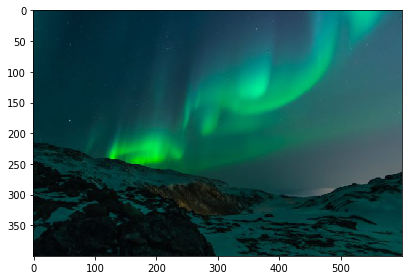

In [0]:
# open image and print

rgb_image = imread('img_lights.jpg')
imshow(rgb_image)

### Image Summary

In [0]:
print_image_summary(rgb_image, ['R', 'G', 'B'])

--------------
Image Details:
--------------
Image dimensions: (400, 600, 3)
Channels:
R : min=0.0000, max=121.0000, mean=15.4849
G : min=0.0000, max=255.0000, mean=71.9745
B : min=0.0000, max=188.0000, mean=69.3320


as you can see, each rgb image as 3 channels [red, green, blue].

the min value is 0, and max value is 255

### Explore Each Channel

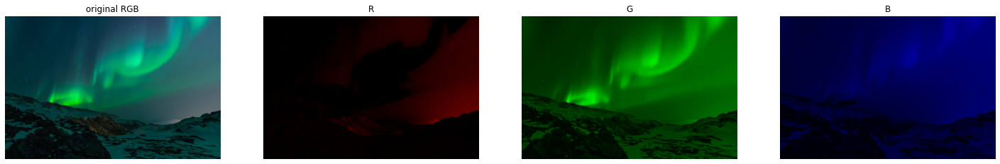

In [0]:
fig, ax = plt.subplots(1, 4, figsize = (25, 25))
ax[0].imshow(rgb_image/255.0) 
ax[0].axis('off')
ax[0].set_title('original RGB')
for i, lab in enumerate(['R','G','B'], 1):
    temp = np.zeros(rgb_image.shape)
    temp[:,:,i - 1] = rgb_image[:,:,i - 1]
    ax[i].imshow(temp/255.0) 
    ax[i].axis("off")
    ax[i].set_title(lab)
plt.show()

## Lab Presentation

### Lab Color Space

The LAB color is expresses color as three values: L* for the lightness from black (0) to white (100), a* from green (−) to red (+), and b* from blue (−) to yellow (+). CIELAB was designed so that the same amount of numerical change in these values corresponds to roughly the same amount of visually perceived change.

Because three parameters are measured, the space itself is a three-dimensional real number space, which allows for infinitely many possible colors. In practice, the space is usually mapped onto a three-dimensional integer space for digital representation, and thus the L*, a*, and b* values are usually absolute, with a pre-defined range. The lightness value, L*, represents the darkest black at L* = 0, and the brightest white at L* = 100. The color channels, a* and b*, represent true neutral gray values at a* = 0 and b* = 0. The a* axis represents the green–red component, with green in the negative direction and red in the positive direction. The b* axis represents the blue–yellow component, with blue in the negative direction and yellow in the positive direction. The scaling and limits of the a* and b* axes will depend on the specific implementation, as described below, but they often run in the range of ±100 or −128 to +127 (signed 8-bit integer).



### Lab Image Summary

In [0]:
# convert RGB image to Lab
lab_image = rgb2lab(rgb_image)

In [0]:
print_image_summary(lab_image, ['L', 'a', 'b'])

--------------
Image Details:
--------------
Image dimensions: (400, 600, 3)
Channels:
L : min=0.0000, max=87.7351, mean=26.8677
a : min=-86.1830, max=12.3661, mean=-15.9466
b : min=-20.6998, max=83.1797, mean=-3.6337


as explained above the values should be between 0-100 for L, -128 to +127 for a and b

### Lets see the images and its channels

In [0]:
# help function to plot some images
def cmap_choser(channel):
  cmap = None
  if channel == 'l' or channel == 'L':
    cmap = 'gray'
  elif channel == 'a':
    cmap = cc.m_diverging_gkr_60_10_c40
  elif channel == 'b':
    cmap = agGrnYl_2.mpl_colormap
  else:
    cmap = 'brg'
  return cmap

def plotter(images, title):
  plt.clf()
  if len(images) == 1:
    cmap = cmap_choser(title[0])
    plt.set_cmap(cmap)
    plt.imshow(images[0])
  else:
    fig, ax = plt.subplots(1, len(images), figsize = (10, 10))
    for i, image in enumerate(images):
        cmap = cmap_choser(title[i])
        ax[i].imshow(image, cmap=cmap) 
        ax[i].axis("off")
        ax[i].set_title(title[i])
  plt.show()
  plt.clf()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


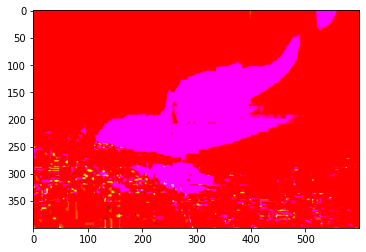

<Figure size 432x288 with 0 Axes>

In [0]:
plotter([lab_image], ['lab'])

so the image is really red, lets explore the channles

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

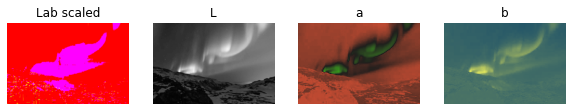

<Figure size 432x288 with 0 Axes>

In [0]:
titles = ['Lab scaled', 'L', 'a', 'b']
lab_images = [lab_image, lab_image[:, :, 0], lab_image[:, :, 1], lab_image[:, :, 2]]
plotter(lab_images, titles)

isn't exactly what we expected, so we dig in a little, and the explanation is very simple, we need to scale the image..
so the values will be between 0-1 for all channels.

just to be sure, we will convert the image back to rgb, and plot it

--------------
Image Details:
--------------
Image dimensions: (400, 600, 3)
Channels:
R : min=0.0000, max=0.4745, mean=0.0607
G : min=0.0000, max=1.0000, mean=0.2823
B : min=0.0000, max=0.7373, mean=0.2719


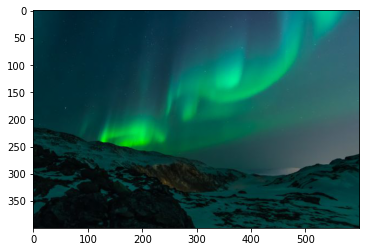

In [0]:
rgb_image2 = lab2rgb(lab_image)
print_image_summary(rgb_image2, ['R', 'G', 'B'])
plt.imshow(rgb_image2)

### Lab Image Scale

In [0]:
image_lab_scaled = (lab_image + [0, 128, 128]) / [100, 255, 255]
print_image_summary(image_lab_scaled, ['L', 'a', 'b'])

--------------
Image Details:
--------------
Image dimensions: (400, 600, 3)
Channels:
L : min=0.0000, max=0.8774, mean=0.2687
a : min=0.1640, max=0.5505, mean=0.4394
b : min=0.4208, max=0.8282, mean=0.4877


this look promising, now we lets see the images and its channels

<Figure size 432x288 with 0 Axes>

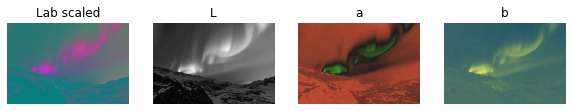

<Figure size 432x288 with 0 Axes>

In [0]:
titles = ['Lab scaled', 'L', 'a', 'b']
lab_images = [image_lab_scaled, image_lab_scaled[:,:,0], image_lab_scaled[:,:,1],
         image_lab_scaled[:,:,2]]
plotter(lab_images, titles)

this is good, we will use the L channel as input, and we will try to learn the a, b channles.
after that we will convert ut to RGB.

as you can see the Lab channeles loking good seperatly because we changed the color map, we can search for lab color map...

### Back To RGB

In [0]:
image_lab_scaled_up = (image_lab_scaled *  [100, 255, 255]) - [0, 128, 128]
rgb3 = lab2rgb(image_lab_scaled_up)
print_image_summary(rgb3, ['R', 'G', 'B'])

--------------
Image Details:
--------------
Image dimensions: (400, 600, 3)
Channels:
R : min=0.0000, max=0.4745, mean=0.0607
G : min=0.0000, max=1.0000, mean=0.2823
B : min=0.0000, max=0.7373, mean=0.2719


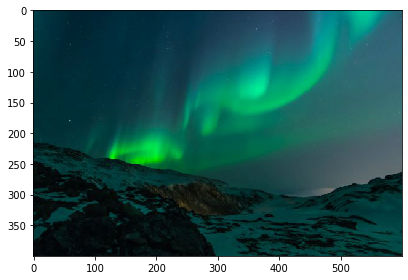

In [0]:
imshow(rgb3) 

wallaaa

# Data Pre-Process

after we played a little with an image, now we can start to learn on the real dataset

## Look At The Dataset 

### load npy files

it looks like our data is already seperated...
lets hope its scaled

In [0]:
x = np.load('./bucket/bw-dataset/l/gray_scale.npy')
ab_scale1 = np.load('./bucket/bw-dataset/ab/ab/ab1.npy')
print(x.shape)
print(ab_scale1.shape)

(25000, 224, 224)
(10000, 224, 224, 2)


### See Example

we will take one example



In [0]:
index = 5000
l = x[index]
ab = ab_scale1[index]
print(l.shape)
print(ab.shape)

(224, 224)
(224, 224, 2)


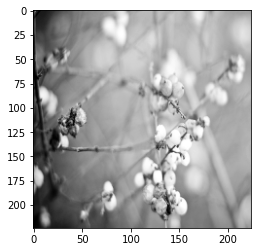

<Figure size 432x288 with 0 Axes>

In [0]:
plotter([l], ['l'])

take a look on the summary

In [0]:
print_image_summary(l, ['L'])
print_image_summary(ab, ['a', 'b'])

--------------
Image Details:
--------------
Image dimensions: (224, 224)
Channels:
L : min=1.0000, max=255.0000, mean=156.7621
--------------
Image Details:
--------------
Image dimensions: (224, 224, 2)
Channels:
a : min=116.0000, max=186.0000, mean=134.0794
b : min=98.0000, max=160.0000, mean=127.8702


little diffrent from the demo image, 
All the channeles is 0 to 255,
we can handle it...


lets see each channel

In [0]:
# first we need to seperate them
a = ab[:, :, 0]
b = ab[:, :, 1]
print(a.shape)
print(b.shape)

(224, 224)
(224, 224)


<Figure size 432x288 with 0 Axes>

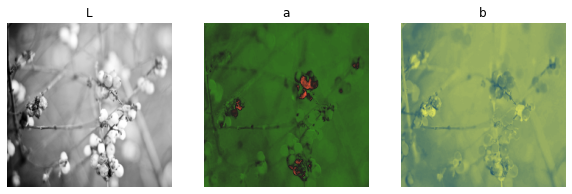

<Figure size 432x288 with 0 Axes>

In [0]:
titles = ['L', 'a', 'b']
lab_images = [l, a, b]
plotter(lab_images, titles)

and now togther as Lab and RGB

In [0]:
# we need to reshape the l channel
H,W = l.shape
l = l.reshape(H, W, 1)
print(l.shape)

(224, 224, 1)


In [0]:
# and now we can stack him on ab channels
lab_sample = np.dstack((l, ab))
rgb_sample = cv2.cvtColor(lab_sample, cv2.COLOR_LAB2RGB)
print('RGB: {}'.format(rgb_sample.shape))
print('Lab: {}'.format(lab_sample.shape))

RGB: (224, 224, 3)
Lab: (224, 224, 3)


<Figure size 432x288 with 0 Axes>

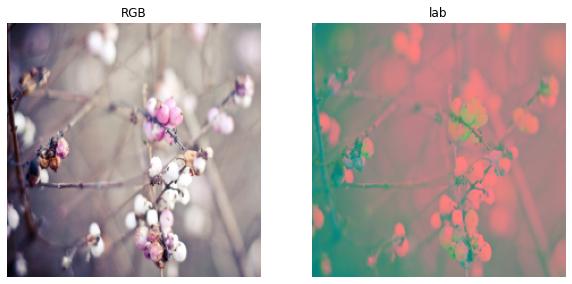

<Figure size 432x288 with 0 Axes>

In [0]:
titles = ['RGB', 'lab']
lab_images = [rgb_sample, lab_sample]
plotter(lab_images, titles)

so the image is great, and all the channels...
the lab color is little wierd because of the color map that belongs to RGB

## Preparation for the dataloader

### Load data and combine it

In [0]:
def combine_ab_files(ab1,ab2,ab3):
  y = np.vstack((ab1,ab2,ab3))
  return y

In [0]:
def load_data():  
  x = np.load('./bucket/bw-dataset/l/gray_scale.npy')
  ab1 = np.load('./bucket/bw-dataset/ab/ab/ab1.npy')
  ab2 = np.load('./bucket/bw-dataset/ab/ab/ab2.npy')
  ab3 = np.load('./bucket/bw-dataset/ab/ab/ab3.npy')
  y = combine_ab_files(ab1, ab2, ab3)
  return x, y

### Split

as test we will take 5% of the dataset.
i think its enough

for val we will take 20% of the dataset.

In [0]:
def split_data(x, y):
  random_int = np.random.randint(100)
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=random_int)
  x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.10, random_state=random_int)
  return x_train, x_val, x_test, y_train, y_val, y_test

### Pre-Normalize

https://cs231n.github.io/neural-networks-2/#summary

The recommended preprocessing is to center the data to have mean of zero, and normalize its scale to [-1, 1] along each feature

**Common pitfall**. An important point to make about the preprocessing is that any preprocessing statistics (e.g. the data mean) must only be computed on the training data, and then applied to the validation / test data. E.g. computing the mean and subtracting it from every image across the entire dataset and then splitting the data into train/val/test splits would be a mistake. Instead, the mean must be computed only over the training data and then subtracted equally from all splits (train/val/test).

In [0]:
# Zero Center the data: subtract the mean image
def find_mean_std(x):
  mean_val = np.mean(x, axis=(0,1,2))
  std_val = np.std(x, axis=(0,1,2))
  return mean_val, std_val

In [0]:
# find the dataset minmax from scaling -1 to 1
def minmax_dataset(x):
  dataset_max = x.max()
  dataset_min = x.min()
  return dataset_max, dataset_min

### Save To Colab

In [0]:
def save_data(data, colab_path, gcs_path):
  np.save(colab_path, data)
  # np.save(gcs_path, data)
  return None

### Put all Togther

In [0]:
x, y = load_data()
x_train, x_val, x_test, y_train, y_val, y_test = split_data(x, y)
mean_val, std_val = find_mean_std(x_train)
dataset_max, dataset_min = minmax_dataset(x)
data = [x_train, x_val, x_test, y_train, y_val, y_test]
path = ['x_train.npy', 'x_val.npy', 'x_test.npy', 
        'y_train.npy', 'y_val.npy', 'y_test.npy']
for d, p in zip(data,path):
  save_data(d, p, '')
# del ab_scale1
del x, y, data, path
del x_train, x_val, x_test, y_train, y_val, y_test

## Helper Functions

### Combine and seprate channels

### Reshaping

In [0]:
# from (N, H, W) to (N, H, W, 1)
def reshape_x(x):
  N, H, W = x.shape
  x = x.reshape(N, H, W, 1)
  return x

In [0]:
# from (H, W) to (H, W, 1)
def reshape_l_up(l):
  H, W = l.shape
  l = l.reshape(H, W, 1)
  return l

In [0]:
# from (H, W, 1) to (H, W)
def reshape_l_down(l):
  H, W, C = l.shape
  l = l.reshape(H, W)
  return l

## Define Dataset Transforms And DataLoader

### Dataset

In [0]:
class BWDataset(Dataset):
  def __init__(self, x_dir, y_dir, transforms):
    self.x = np.load(x_dir)
    self.y = np.load(y_dir)
    self.transforms = transforms


  def __getitem__(self, index):
    l_image = self.x[index]
    ab_image = self.y[index]

    
    l_image = cv2.resize(l_image, (192,192), interpolation=cv2.INTER_AREA)
    ab_image = cv2.resize(ab_image, (192,192), interpolation=cv2.INTER_AREA)

    l_image = self.transforms(l_image)
    ab_image = self.transforms(ab_image)
    return l_image, ab_image

  def __len__(self):
    return len(self.x)


### Transforms

In [0]:
class Scaling(object):
  """Rescale the image in a sample to a given range.
  """
  def __init__(self, scale_range=(-1, 1), min_max=(0,255)):
    self.max_value = min_max[0]
    self.min_value = min_max[1]
    self.a = scale_range[0]
    self.b = scale_range[1]


  def __call__(self, sample):
      sample = self.a + (
          ((sample - self.min_value) * (self.b - self.a)) 
          / (self.max_value - self.min_value))

      return sample


In [0]:
mean_value = (mean_val - dataset_min) / (dataset_max - dataset_min) 
std_value = (std_val - dataset_min) / (dataset_max - dataset_min) 
train_transform = transforms.Compose([transforms.ToTensor(),
                                      transforms.Normalize(mean=[mean_value], std=[std_value])])

### Load Data

In [0]:
train_folder = BWDataset(x_dir='x_train.npy', y_dir='y_train.npy',
                         transforms=train_transform)
val_folder = BWDataset(x_dir='x_val.npy', y_dir='y_val.npy',
                         transforms=train_transform)
test_folder = BWDataset(x_dir='x_test.npy', y_dir='y_test.npy',
                         transforms=train_transform)

In [0]:
batch_size = 64
train_loader = torch.utils.data.DataLoader(train_folder, 
                                           batch_size=batch_size, 
                                           shuffle=True)
val_loader = torch.utils.data.DataLoader(val_folder, 
                                           batch_size=batch_size, 
                                           shuffle=True)
test_loader = torch.utils.data.DataLoader(test_folder, 
                                           batch_size=batch_size, 
                                           shuffle=True)

### Reverse Transform

In [0]:
def reverse_transform_original(l, ab):
  lab = l_ab2lab(l, ab)
  lab_scaled = (lab * std_value) + mean_value
  image_lab_scaled_up = (lab_scaled *  [255, 255, 255])
  image_lab_scaled_up = image_lab_scaled_up.astype(np.uint8)
  rgb = m_lab2rgb(image_lab_scaled_up)
  return rgb

def reverse_transform_pred(l, ab):
  l = (l * std_value) + mean_value
  lab = l_ab2lab(l, ab)
  image_lab_scaled_up = (lab *  [255, 255, 255])
  image_lab_scaled_up = image_lab_scaled_up.astype(np.uint8)
  rgb = m_lab2rgb(image_lab_scaled_up)
  return rgb

# Change names problem!!!


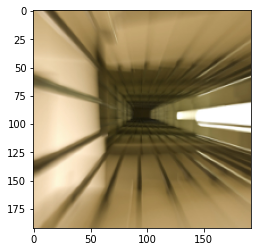

<Figure size 432x288 with 0 Axes>

In [0]:
images,targets = next(iter(train_loader))
x = images[0].numpy()
y = targets[0].numpy()
rgb_test= reverse_transform_original(x, y)
plotter([rgb_test], ['rgb'])

# Define Model

## New Section

In [0]:
class Conv(nn.Module):
    def __init__(self, input_c, output_c, kernel=3, stride=1, padding=1, bias=False):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(input_c, output_c, kernel, stride=stride,
                    padding=padding, bias=bias),
            nn.BatchNorm2d(output_c),
            nn.LeakyReLU(0.2),
            nn.Conv2d(output_c, output_c, kernel, stride=stride,
                    padding=padding, bias=bias),
            nn.BatchNorm2d(output_c),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

In [0]:
class DeConv(nn.Module):
    def __init__(self, input_c, output_c, kernel=3, stride=2, padding=1, output_padding=1):
        super().__init__()
        self.deconv = nn.ConvTranspose2d(input_c, output_c, kernel,
                                         padding=padding, stride=stride, output_padding=output_padding)
        self.act = nn.LeakyReLU(0.2)  

    def forward(self, x, skip_x):
        x = self.deconv(x)
        x = self.act(x)
        x = torch.cat([skip_x, x], axis=1)

        return x

In [0]:
class Unet(nn.Module):
  def __init__(self, in_c, out_c):
    super(Unet, self).__init__()
    self.input_channels = in_c
    self.output_channels = out_c
    
    self.down1 = Conv(in_c, 32)
    self.down2 = Conv(32, 64)
    self.down3 = Conv(64, 128)
    self.down4 = Conv(128, 256)
    self.down5 = Conv(256, 512)
    self.down6 = Conv(512, 512)

    self.m = Conv(512, 512)

    self.up6 = DeConv(512, 512)
    self.up6conv = Conv(1024, 512)
    
    self.up5 = DeConv(512, 512)
    self.up5conv = Conv(1024, 512)
    
    self.up4 = DeConv(512, 256)
    self.up4conv = Conv(512, 256)
    
    self.up3 = DeConv(256, 128)
    self.up3conv = Conv(256, 128)
    
    self.up2 = DeConv(128, 64)
    self.up2conv = Conv(128, 64)
    
    self.up1 = DeConv(64, 32)
    self.up1conv = Conv(64, 32)


    self.mp = nn.MaxPool2d(2)
    
    self.last_conv = nn.Conv2d(32, out_c, kernel_size=1)
    self.act_out = nn.Tanh()


  def forward(self, x):

    down1 = self.down1(x)             # down1 = (64x192x192)

    mp1 = self.mp(down1)              # mp1 =   (64x96x96)

    down2 = self.down2(mp1)           # down2 = (128x96x96)

    mp2 = self.mp(down2)              # mp2 =   (128x48x48)

    down3 = self.down3(mp2)           # down3 = (256x48x48)

    mp3 = self.mp(down3)              # mp3 =   (256x24x24)

    down4 = self.down4(mp3)           # down4 = (512x24x24)

    mp4 = self.mp(down4)              # mp4 =   (512x12x12)

    down5 = self.down5(mp4)           # down5 = (512x12x12)

    mp5 = self.mp(down5)              # mp5 =   (512x6x6)

    down6 = self.down6(mp5)           # down6 = (512x6x6)

    mp6 = self.mp(down6)              # mp6 = (1024x3x3)


    middle = self.m(mp6)              # middle = (1024x3x3)


    up6 = self.up6(middle, down6)     # up6 = (1024x6x6)
    up6conv = self.up6conv(up6)       # up6conv = (1024x6x6)

    up5 = self.up5(up6conv, down5)    # up5 = (1024x12x12)
    up5conv = self.up5conv(up5)       # up6conv = (512x12x12)
    
    up4 = self.up4(up5conv, down4)    # up4 = (512x24x24)
    up4conv = self.up4conv(up4)       # up4conv = (256x24x24)

    up3 = self.up3(up4conv, down3)    # up3 = (256x48x48)
    up3conv = self.up3conv(up3)       # up3conv = (128x48x48)

    up2 = self.up2(up3conv, down2)    # up2 = (128x96x96)
    up2conv = self.up2conv(up2)       # up2conv = (64x96x96)

    up1 = self.up1(up2conv, down1)    # up1 = (64x192x192)
    up1conv = self.up1conv(up1)       # up1conv = (32x192x192)

    pre_act = self.last_conv(up1conv) # (2x192x192)
    out =  self.act_out(pre_act)
    return out

In [0]:
model = Unet(1 , 2)
optimizer = optim.Adam(model.parameters(), lr=0.0002)
loss_criterion = nn.L1Loss()
# loss_criterion = nn.MSELoss()
# loss_criterion = nn.SmoothL1Loss()

In [0]:
model.to(device)

Unet(
  (down1): Conv(
    (conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): LeakyReLU(negative_slope=0.2)
    )
  )
  (down2): Conv(
    (conv): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): LeakyReLU(negative_slope=0.2)
    )
  )
  (down3)

In [0]:
stats = {}
number_of_batches = len(train_folder) / batch_size
for epoch in range(50):
  epoch_stats = {}
  epoch_stats['epoch_loss_total'] = 0
  epoch_stats['val_loss_total'] = 0
  epoch_stats['batch_loss'] = {}
  epoch_stats['val_loss'] = {}
  for i, data in enumerate(train_loader):
        
    model.train()
    
    batch = data[0]
    batch_y = data[1]
    batch = batch.to(device, dtype=torch.float32)
    batch_y = batch_y.to(device, dtype=torch.float32)

    optimizer.zero_grad()
    pred = model(batch)

    loss  = loss_criterion(pred, batch_y)
    
    epoch_stats['epoch_loss_total'] += loss.item()
    epoch_stats['batch_loss'][i] = loss.item()

    loss.backward()
    optimizer.step()

    print('epoch: {}, batch: {}, train loss: {}'.format(epoch, i, loss.item()))
   
    if (i % 20 == 0):
      model.eval()
      with torch.no_grad():
        val_loss = 0
        for val_i in range(5):
          x, y = next(iter(val_loader)) 

          x = x.to(device, dtype=torch.float32)
          y = y.to(device, dtype=torch.float32)

          pred = model(x)

          val_loss += loss_criterion(pred, batch_y)

      epoch_stats['val_loss'][val_i] = val_loss.item() / (val_i+1) 
      print('val loss: {}'.format(epoch_stats['val_loss'][val_i]))
      epoch_stats['val_loss_total'] =   epoch_stats['val_loss_total'] + epoch_stats['val_loss'][val_i]

  epoch_stats['epoch_loss_avg'] = epoch_stats['epoch_loss_total'] / number_of_batches
  epoch_stats['val_loss_avg'] = epoch_stats['val_loss_total'] / int(number_of_batches / 10)

  
  stats['epoch' + str(epoch)] = epoch_stats
  torch.save(model.state_dict(), '/content/bucket/models/bn_epoch%d_train-loss%f_val-loss%f.pth' 
             % (epoch, epoch_stats['epoch_loss_avg'], epoch_stats['val_loss_avg']))


with open("/content/bucket/stats/bn_stats.pkl","ab") as f:
  pickle.dump(stats,f)

Streaming output truncated to the last 5000 lines.
epoch: 35, batch: 253, train loss: 0.15791161358356476
epoch: 35, batch: 254, train loss: 0.12321285158395767
epoch: 35, batch: 255, train loss: 0.1587200164794922
epoch: 35, batch: 256, train loss: 0.13649572432041168
epoch: 35, batch: 257, train loss: 0.12932021915912628
epoch: 35, batch: 258, train loss: 0.17040573060512543
epoch: 35, batch: 259, train loss: 0.1285925656557083
epoch: 35, batch: 260, train loss: 0.14860551059246063
val loss: 0.1720919132232666
epoch: 35, batch: 261, train loss: 0.135191410779953
epoch: 35, batch: 262, train loss: 0.10752280801534653
epoch: 35, batch: 263, train loss: 0.13987012207508087
epoch: 35, batch: 264, train loss: 0.1270381510257721
epoch: 35, batch: 265, train loss: 0.13683216273784637
epoch: 35, batch: 266, train loss: 0.1325603574514389
epoch: 35, batch: 267, train loss: 0.13907918334007263
epoch: 35, batch: 268, train loss: 0.1460779458284378
epoch: 35, batch: 269, train loss: 0.1466452777

In [0]:
model.load_state_dict(torch.load('/content/bucket/models/bn_epoch29_train-loss0.135775_val-loss0.077552.pth'))
model.to(device)

Unet(
  (down1): Conv(
    (conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): LeakyReLU(negative_slope=0.2)
    )
  )
  (down2): Conv(
    (conv): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): LeakyReLU(negative_slope=0.2)
    )
  )
  (down3)

In [0]:
def test_model():
  model.eval()
  with torch.no_grad():
    x, y = next(iter(test_loader))  
    x = x.to(device, dtype=torch.float32)
    y = y.to(device, dtype=torch.float32)

    pred = model(x)

    x_sample = x.to('cpu').numpy()
    y_sample = y.to('cpu').numpy()
    y_sample_pred = pred.to('cpu').numpy()

    for image in range(len(y_sample_pred)):
      real_image = reverse_transform_original(x_sample[image], y_sample[image])
      pred_image = reverse_transform_pred(x_sample[image], y_sample_pred[image])
      plotter([real_image, pred_image], ['rgb', 'rgb'])

<Figure size 432x288 with 0 Axes>

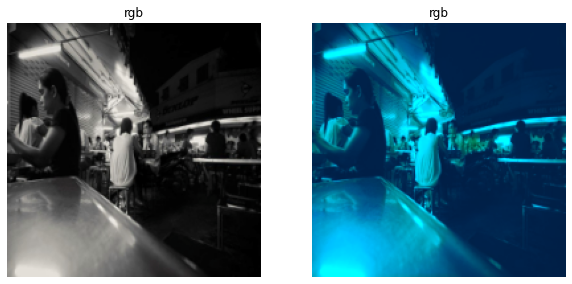

<Figure size 432x288 with 0 Axes>

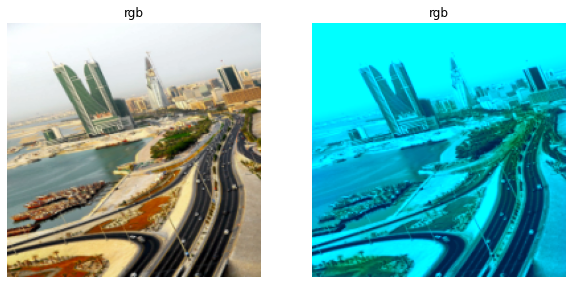

<Figure size 432x288 with 0 Axes>

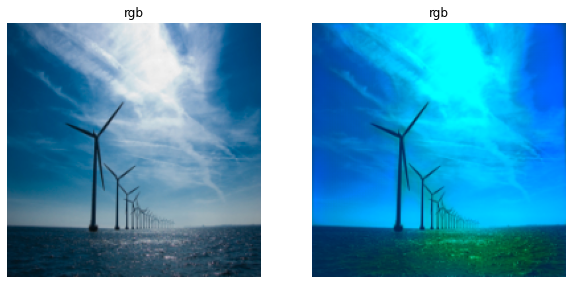

<Figure size 432x288 with 0 Axes>

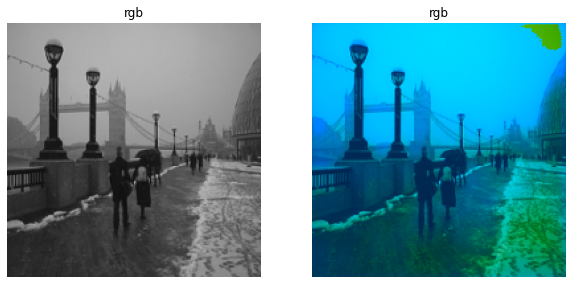

<Figure size 432x288 with 0 Axes>

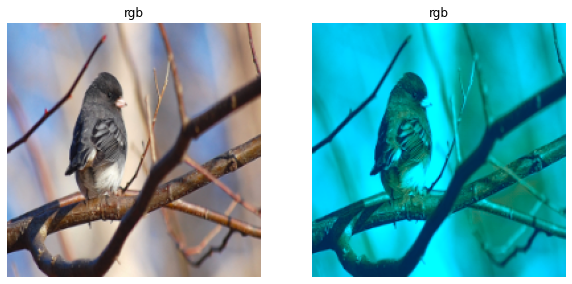

<Figure size 432x288 with 0 Axes>

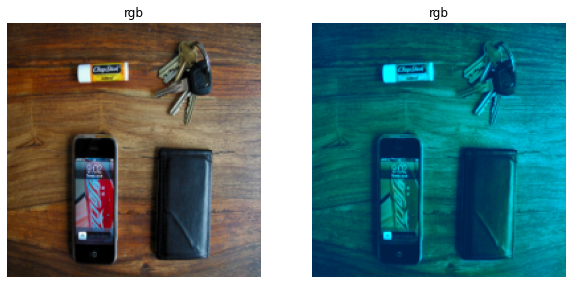

<Figure size 432x288 with 0 Axes>

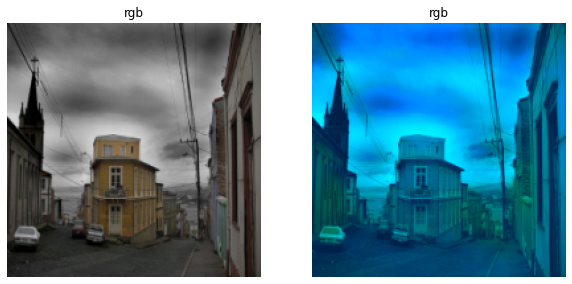

<Figure size 432x288 with 0 Axes>

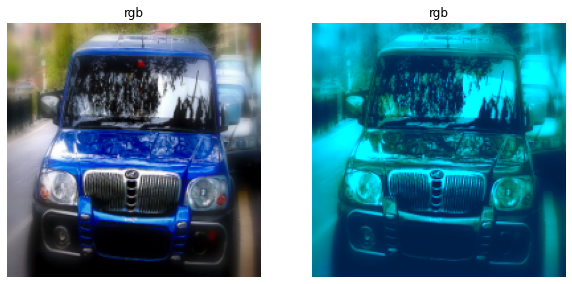

<Figure size 432x288 with 0 Axes>

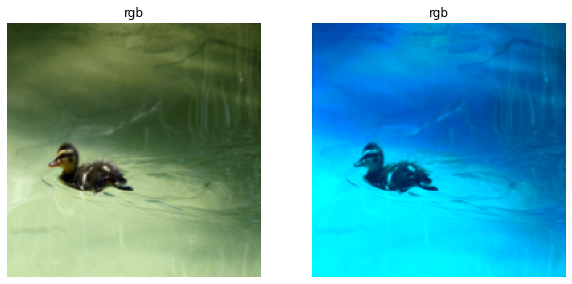

<Figure size 432x288 with 0 Axes>

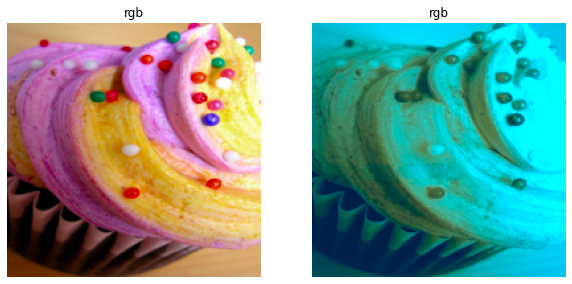

<Figure size 432x288 with 0 Axes>

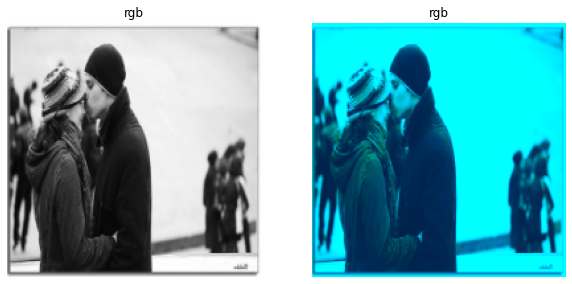

<Figure size 432x288 with 0 Axes>

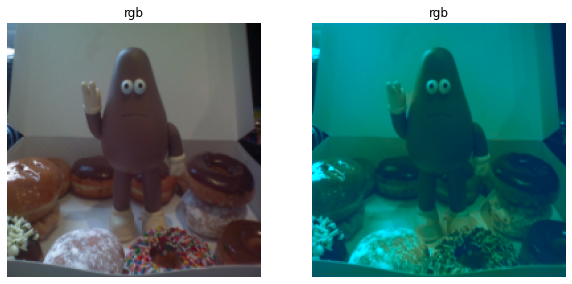

<Figure size 432x288 with 0 Axes>

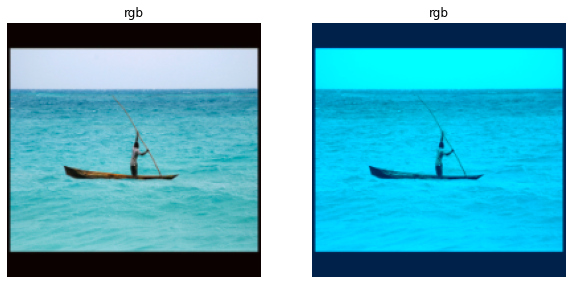

<Figure size 432x288 with 0 Axes>

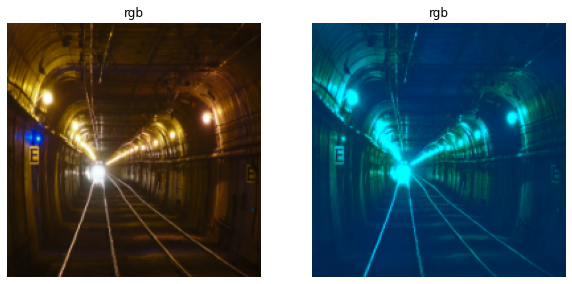

<Figure size 432x288 with 0 Axes>

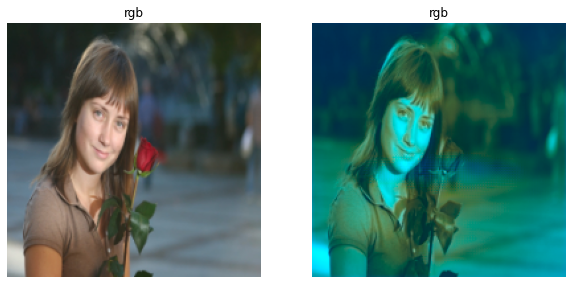

<Figure size 432x288 with 0 Axes>

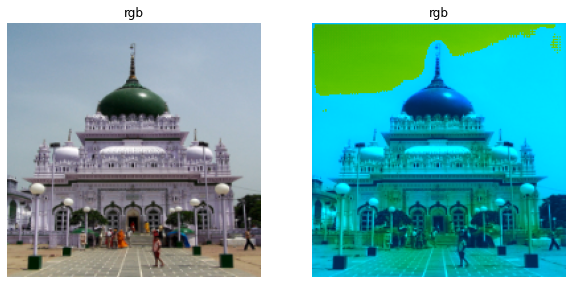

<Figure size 432x288 with 0 Axes>

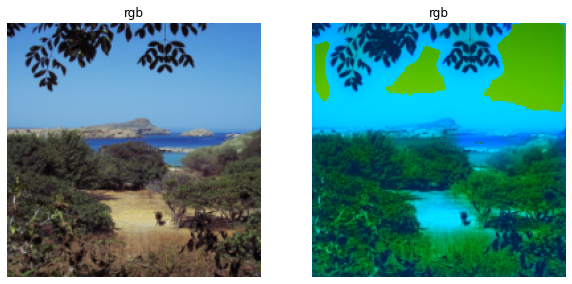

<Figure size 432x288 with 0 Axes>

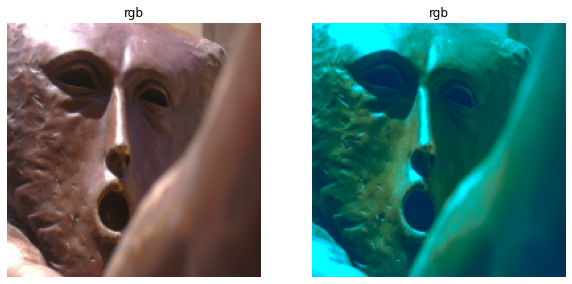

<Figure size 432x288 with 0 Axes>

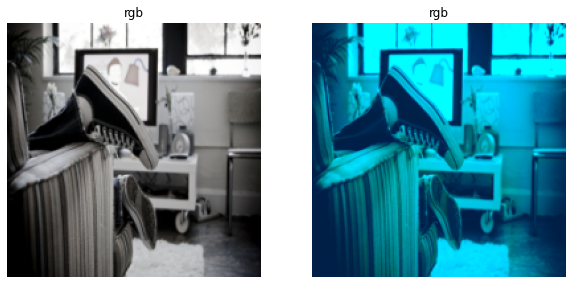

<Figure size 432x288 with 0 Axes>

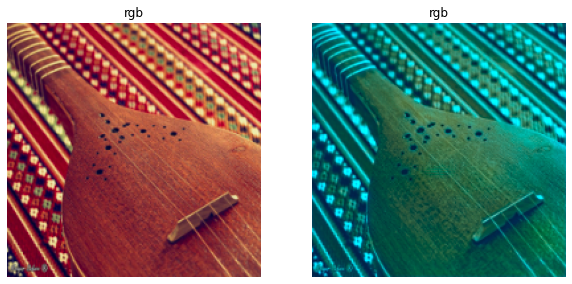

<Figure size 432x288 with 0 Axes>

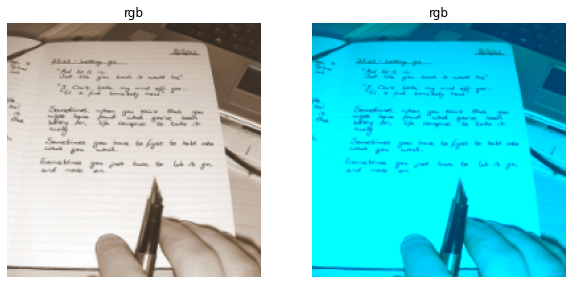

<Figure size 432x288 with 0 Axes>

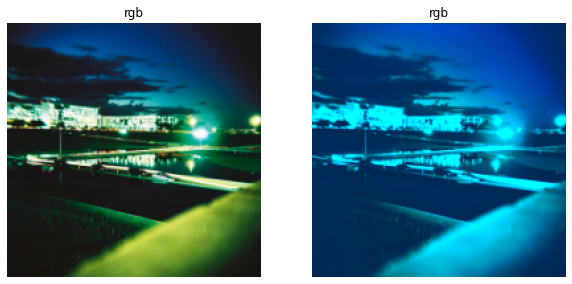

<Figure size 432x288 with 0 Axes>

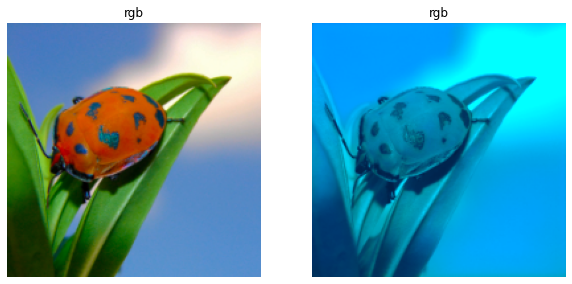

<Figure size 432x288 with 0 Axes>

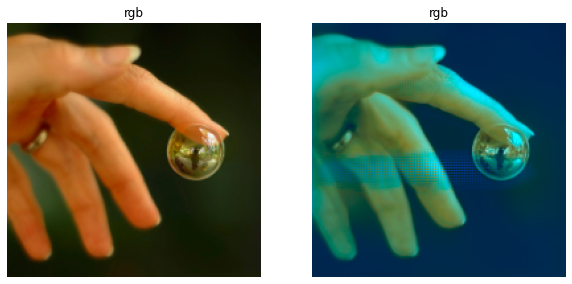

<Figure size 432x288 with 0 Axes>

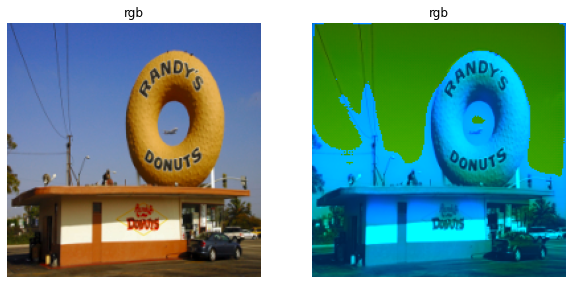

<Figure size 432x288 with 0 Axes>

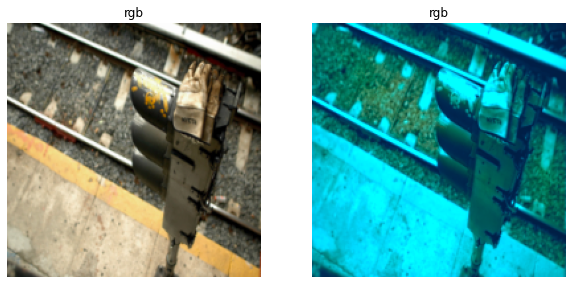

<Figure size 432x288 with 0 Axes>

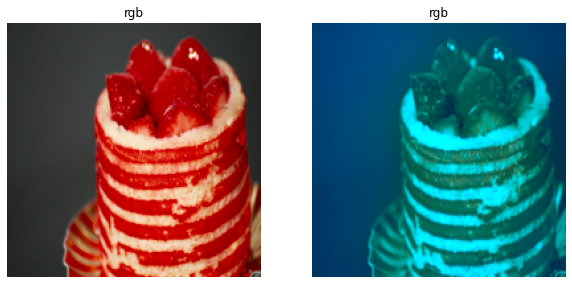

<Figure size 432x288 with 0 Axes>

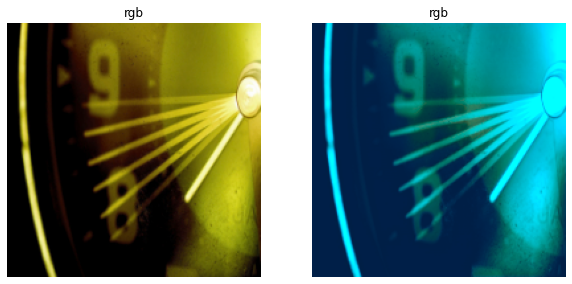

<Figure size 432x288 with 0 Axes>

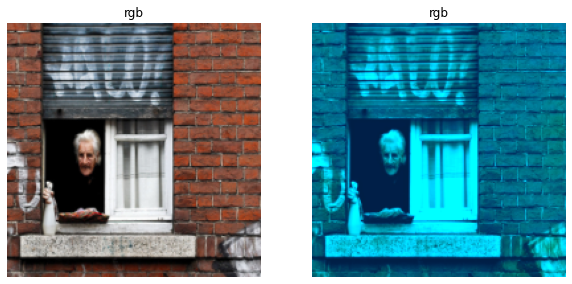

<Figure size 432x288 with 0 Axes>

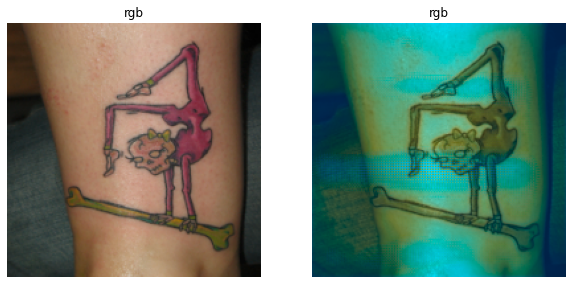

<Figure size 432x288 with 0 Axes>

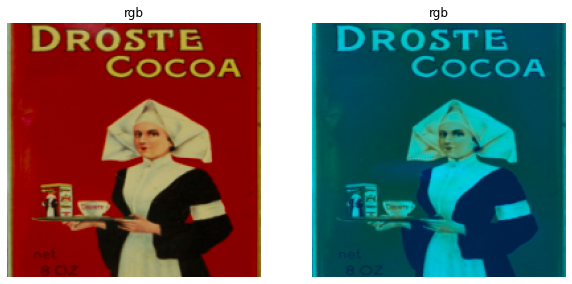

<Figure size 432x288 with 0 Axes>

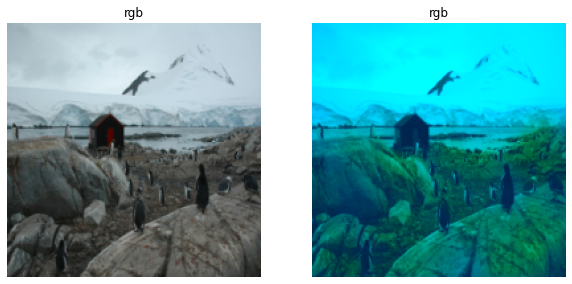

<Figure size 432x288 with 0 Axes>

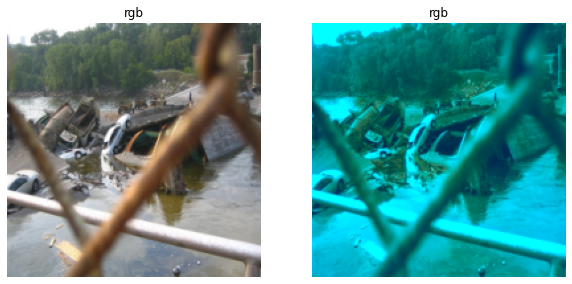

<Figure size 432x288 with 0 Axes>

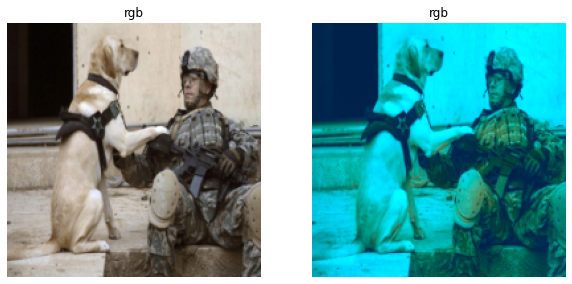

<Figure size 432x288 with 0 Axes>

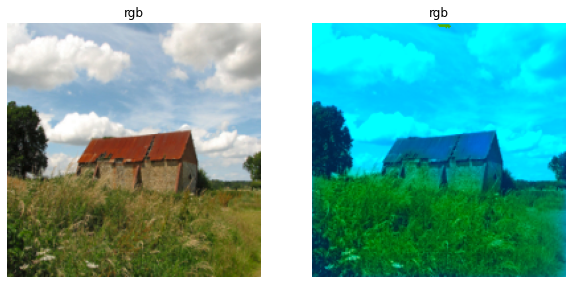

<Figure size 432x288 with 0 Axes>

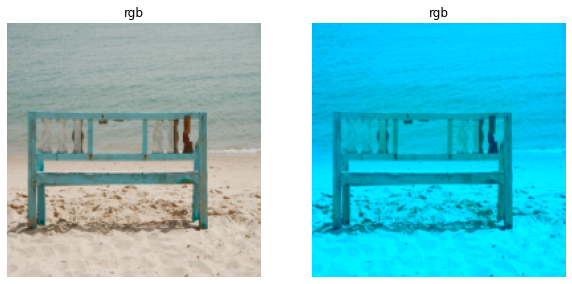

<Figure size 432x288 with 0 Axes>

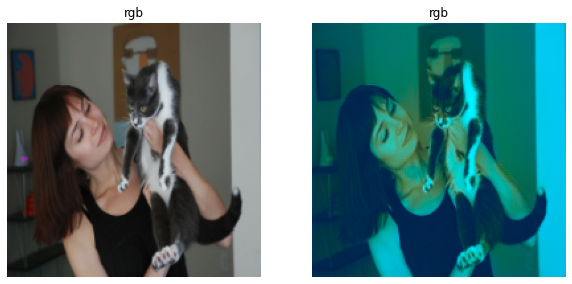

<Figure size 432x288 with 0 Axes>

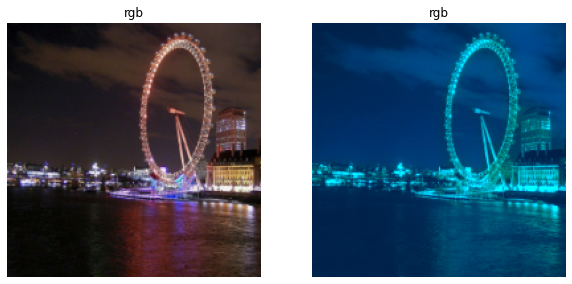

<Figure size 432x288 with 0 Axes>

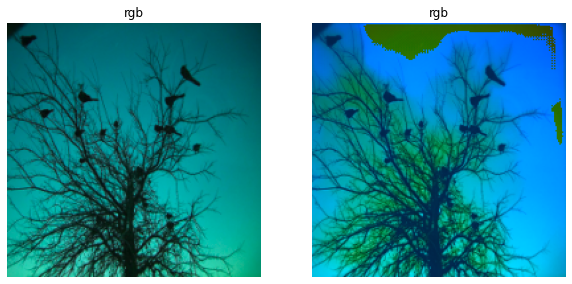

<Figure size 432x288 with 0 Axes>

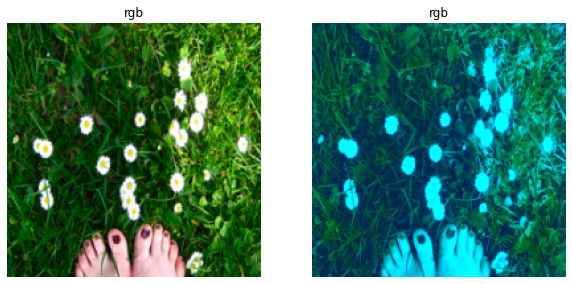

<Figure size 432x288 with 0 Axes>

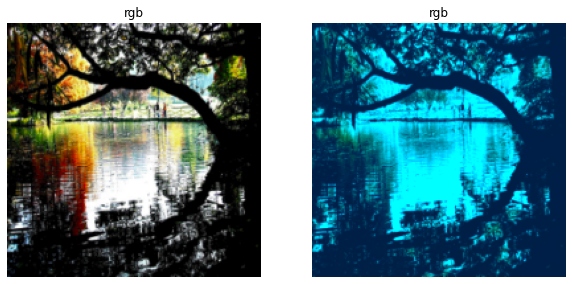

<Figure size 432x288 with 0 Axes>

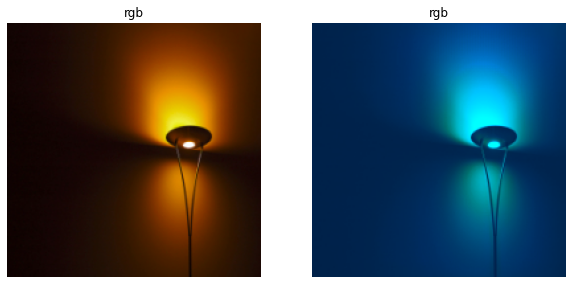

<Figure size 432x288 with 0 Axes>

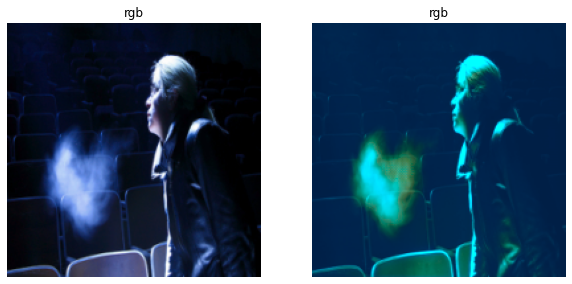

<Figure size 432x288 with 0 Axes>

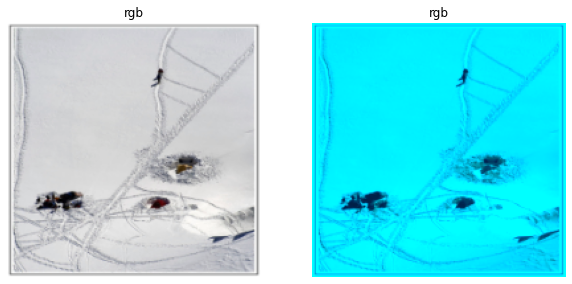

<Figure size 432x288 with 0 Axes>

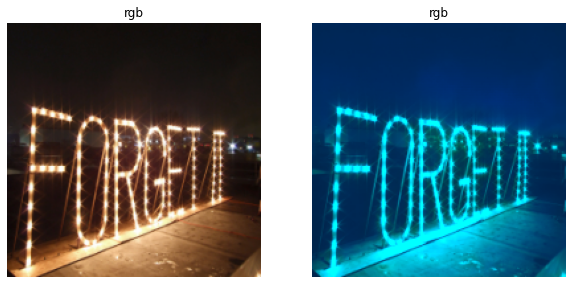

<Figure size 432x288 with 0 Axes>

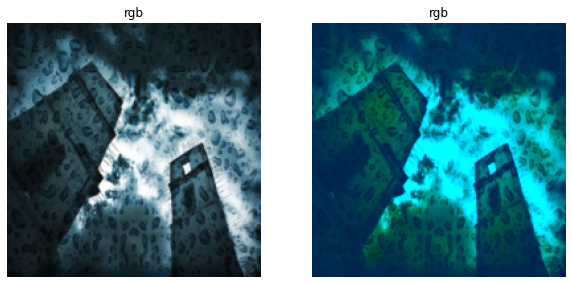

<Figure size 432x288 with 0 Axes>

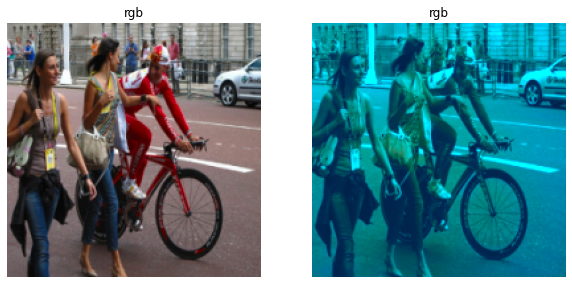

<Figure size 432x288 with 0 Axes>

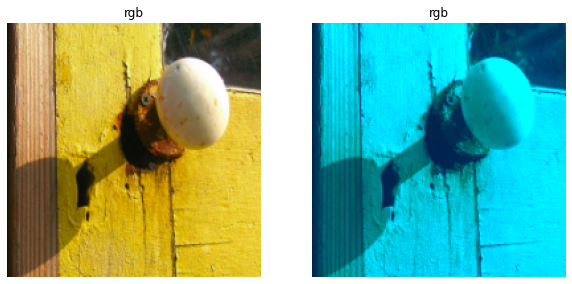

<Figure size 432x288 with 0 Axes>

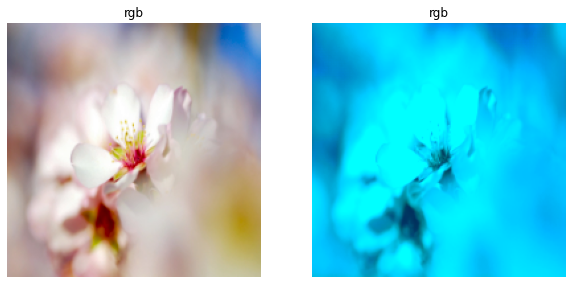

<Figure size 432x288 with 0 Axes>

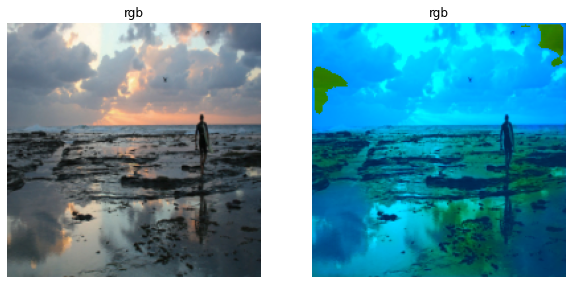

<Figure size 432x288 with 0 Axes>

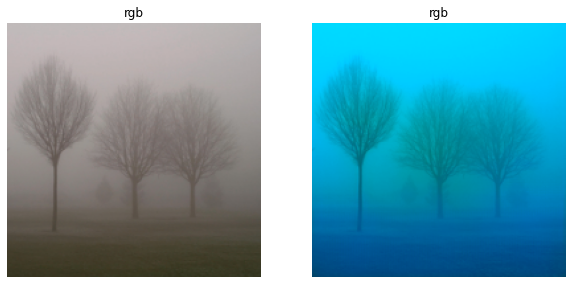

<Figure size 432x288 with 0 Axes>

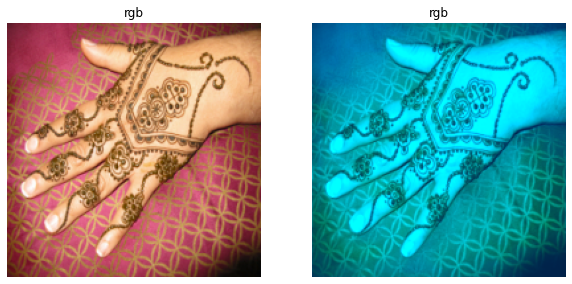

<Figure size 432x288 with 0 Axes>

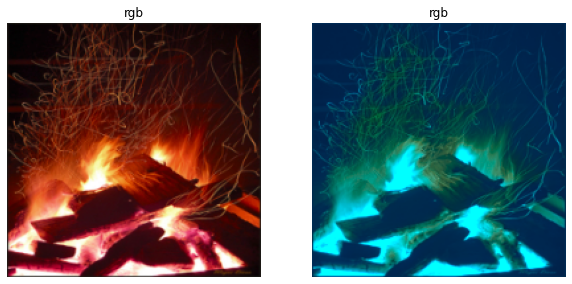

<Figure size 432x288 with 0 Axes>

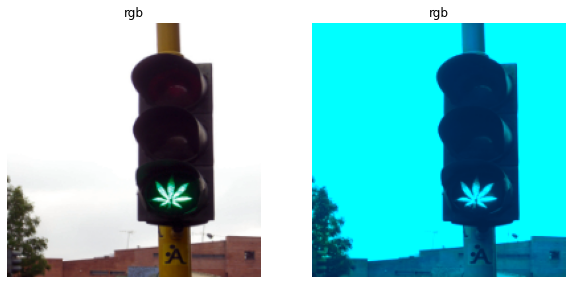

<Figure size 432x288 with 0 Axes>

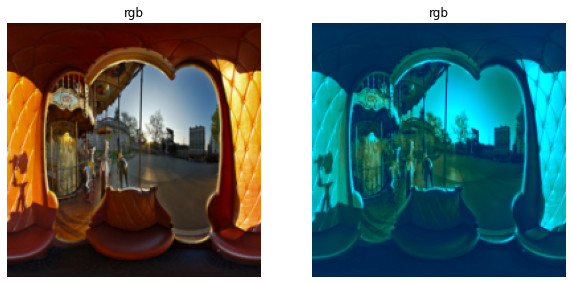

<Figure size 432x288 with 0 Axes>

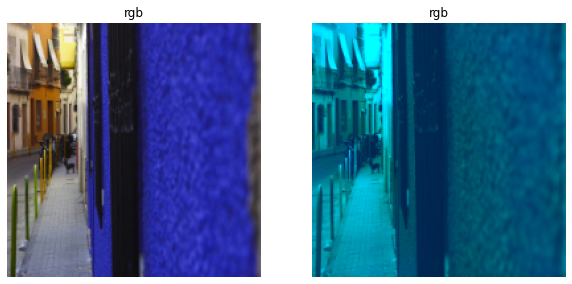

<Figure size 432x288 with 0 Axes>

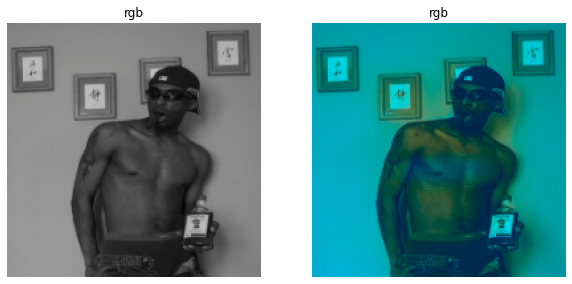

<Figure size 432x288 with 0 Axes>

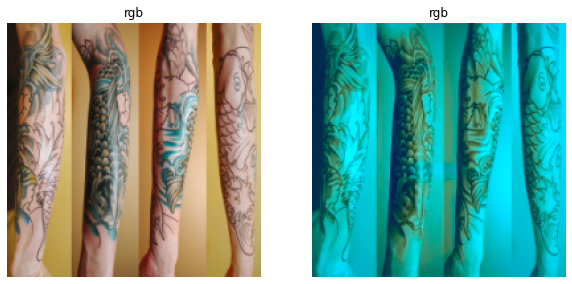

<Figure size 432x288 with 0 Axes>

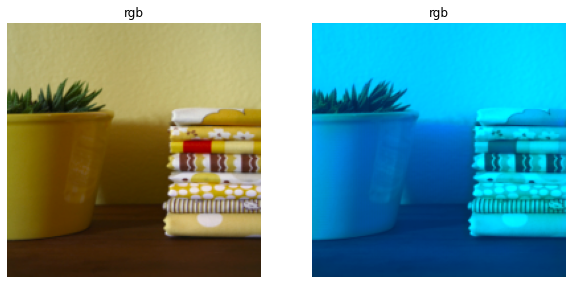

<Figure size 432x288 with 0 Axes>

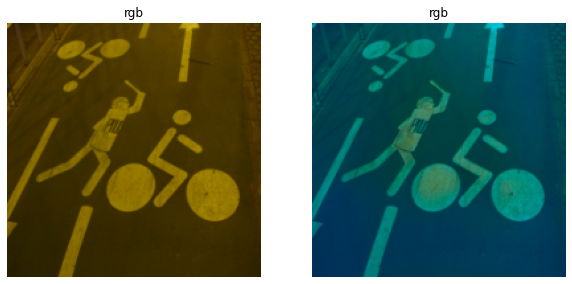

<Figure size 432x288 with 0 Axes>

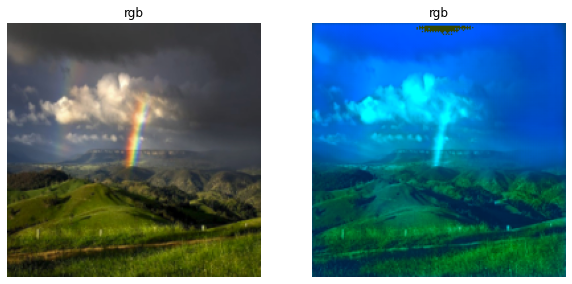

<Figure size 432x288 with 0 Axes>

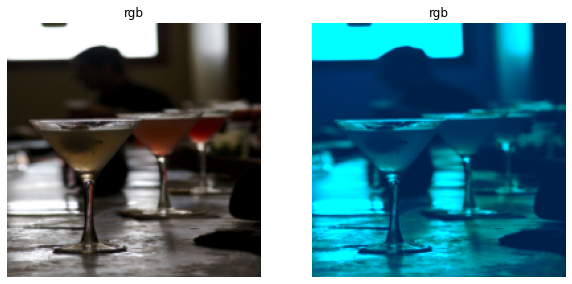

<Figure size 432x288 with 0 Axes>

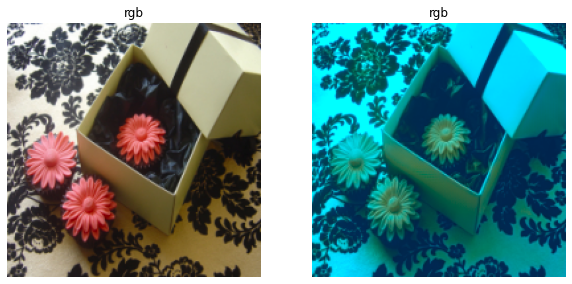

<Figure size 432x288 with 0 Axes>

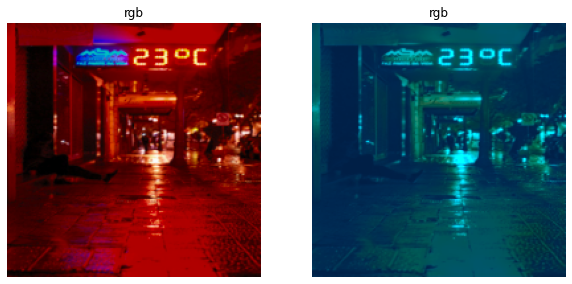

<Figure size 432x288 with 0 Axes>

In [0]:
test_model()

# **Im here!!!**
if someone want to continue....

after that add more transforms
1. add graphs

2. start building the model with gan

3. data augmantions